In [1]:
import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Subset, ConcatDataset
import numpy as np
import matplotlib.pyplot as plt
import os
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, classification_report
from tqdm.notebook import tqdm 
import torch.autograd as autograd

print("PyTorch Version:", torch.__version__)
print("Torchvision Version:", torchvision.__version__)
print("GPU Available:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("GPU Name:", torch.cuda.get_device_name(0))

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

PyTorch Version: 2.5.1+cu124
Torchvision Version: 0.20.1+cu124
GPU Available: True
GPU Name: Tesla P100-PCIE-16GB
Using device: cuda


100%|██████████| 170M/170M [00:02<00:00, 57.6MB/s]


Extracting ./data/cifar-10-python.tar.gz to ./data
Total limited training samples: 3000
Files already downloaded and verified
Total test samples (selected classes): 3000


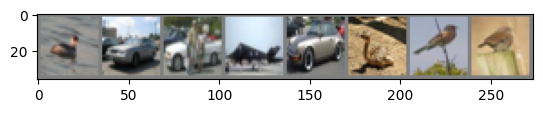

bird  automobile automobile airplane automobile bird  bird  bird 


In [2]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

full_train_dataset = datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)

selected_classes = [0, 1, 2]
samples_per_class = 1000 

limited_train_indices = []
targets = np.array(full_train_dataset.targets)
for class_idx in selected_classes:
    class_indices = np.where(targets == class_idx)[0]
    np.random.shuffle(class_indices)
    limited_train_indices.extend(class_indices[:samples_per_class])

limited_train_dataset = Subset(full_train_dataset, limited_train_indices)
print(f"Total limited training samples: {len(limited_train_dataset)}")

full_test_dataset = datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)

test_indices = []
test_targets = np.array(full_test_dataset.targets)
for class_idx in selected_classes:
    test_indices.extend(np.where(test_targets == class_idx)[0])

test_dataset = Subset(full_test_dataset, test_indices)
print(f"Total test samples (selected classes): {len(test_dataset)}")


batch_size = 64 
train_loader = DataLoader(limited_train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

def imshow(img):
    img = img / 2 + 0.5     
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0))) 
    plt.show()

dataiter = iter(train_loader)
images, labels = next(dataiter)
imshow(torchvision.utils.make_grid(images[:8])) 
print(' '.join(f'{full_train_dataset.classes[labels[j]]:5s}' for j in range(8)))

In [3]:
import torch.nn.functional as F

class SimpleCNN(nn.Module):
    def __init__(self, num_classes=3):
        super(SimpleCNN, self).__init__()
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=16, kernel_size=3, padding=1) 
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3, padding=1)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2) 


        self.fc1 = nn.Linear(in_features=32 * 8 * 8, out_features=128)
        self.fc2 = nn.Linear(in_features=128, out_features=num_classes)

    def forward(self, x):
        x = self.pool1(F.relu(self.conv1(x)))
        x = self.pool2(F.relu(self.conv2(x)))

        x = x.view(-1, 32 * 8 * 8) 

        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x

num_classes = len(selected_classes) 
baseline_classifier = SimpleCNN(num_classes=num_classes).to(device) 
print("Baseline Classifier Architecture:")
print(baseline_classifier)

Baseline Classifier Architecture:
SimpleCNN(
  (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=2048, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=3, bias=True)
)


In [4]:
criterion = nn.CrossEntropyLoss() 
optimizer = optim.Adam(baseline_classifier.parameters(), lr=0.001)


--- Starting Baseline Classifier Training ---


Epoch 1/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [1/75], Loss: 0.7758


Epoch 2/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [2/75], Loss: 0.5350


Epoch 3/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [3/75], Loss: 0.4837


Epoch 4/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [4/75], Loss: 0.4524


Epoch 5/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [5/75], Loss: 0.4329


Epoch 6/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [6/75], Loss: 0.3922


Epoch 7/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [7/75], Loss: 0.3517


Epoch 8/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [8/75], Loss: 0.3323


Epoch 9/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [9/75], Loss: 0.3064


Epoch 10/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [10/75], Loss: 0.2895


Epoch 11/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [11/75], Loss: 0.2459


Epoch 12/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [12/75], Loss: 0.2373


Epoch 13/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [13/75], Loss: 0.2094


Epoch 14/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [14/75], Loss: 0.2043


Epoch 15/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [15/75], Loss: 0.1721


Epoch 16/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [16/75], Loss: 0.1567


Epoch 17/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [17/75], Loss: 0.1330


Epoch 18/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [18/75], Loss: 0.1142


Epoch 19/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [19/75], Loss: 0.0942


Epoch 20/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [20/75], Loss: 0.0745


Epoch 21/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [21/75], Loss: 0.0682


Epoch 22/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [22/75], Loss: 0.0597


Epoch 23/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [23/75], Loss: 0.0462


Epoch 24/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [24/75], Loss: 0.0464


Epoch 25/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [25/75], Loss: 0.0412


Epoch 26/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [26/75], Loss: 0.0265


Epoch 27/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [27/75], Loss: 0.0174


Epoch 28/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [28/75], Loss: 0.0140


Epoch 29/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [29/75], Loss: 0.0106


Epoch 30/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [30/75], Loss: 0.0106


Epoch 31/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [31/75], Loss: 0.0088


Epoch 32/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [32/75], Loss: 0.0087


Epoch 33/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [33/75], Loss: 0.0182


Epoch 34/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [34/75], Loss: 0.0202


Epoch 35/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [35/75], Loss: 0.0086


Epoch 36/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [36/75], Loss: 0.0051


Epoch 37/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [37/75], Loss: 0.0042


Epoch 38/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [38/75], Loss: 0.0033


Epoch 39/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [39/75], Loss: 0.0028


Epoch 40/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [40/75], Loss: 0.0024


Epoch 41/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [41/75], Loss: 0.0023


Epoch 42/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [42/75], Loss: 0.0019


Epoch 43/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [43/75], Loss: 0.0017


Epoch 44/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [44/75], Loss: 0.0015


Epoch 45/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [45/75], Loss: 0.0015


Epoch 46/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [46/75], Loss: 0.0014


Epoch 47/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [47/75], Loss: 0.0013


Epoch 48/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [48/75], Loss: 0.0011


Epoch 49/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [49/75], Loss: 0.0010


Epoch 50/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [50/75], Loss: 0.0010


Epoch 51/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [51/75], Loss: 0.0009


Epoch 52/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [52/75], Loss: 0.0008


Epoch 53/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [53/75], Loss: 0.0008


Epoch 54/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [54/75], Loss: 0.0008


Epoch 55/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [55/75], Loss: 0.0007


Epoch 56/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [56/75], Loss: 0.0007


Epoch 57/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [57/75], Loss: 0.0006


Epoch 58/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [58/75], Loss: 0.0006


Epoch 59/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [59/75], Loss: 0.0006


Epoch 60/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [60/75], Loss: 0.0005


Epoch 61/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [61/75], Loss: 0.0005


Epoch 62/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [62/75], Loss: 0.0005


Epoch 63/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [63/75], Loss: 0.0005


Epoch 64/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [64/75], Loss: 0.0004


Epoch 65/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [65/75], Loss: 0.0004


Epoch 66/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [66/75], Loss: 0.0004


Epoch 67/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [67/75], Loss: 0.0004


Epoch 68/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [68/75], Loss: 0.0004


Epoch 69/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [69/75], Loss: 0.0003


Epoch 70/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [70/75], Loss: 0.0003


Epoch 71/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [71/75], Loss: 0.0003


Epoch 72/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [72/75], Loss: 0.0003


Epoch 73/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [73/75], Loss: 0.0003


Epoch 74/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [74/75], Loss: 0.0003


Epoch 75/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [75/75], Loss: 0.0003
--- Finished Baseline Classifier Training ---


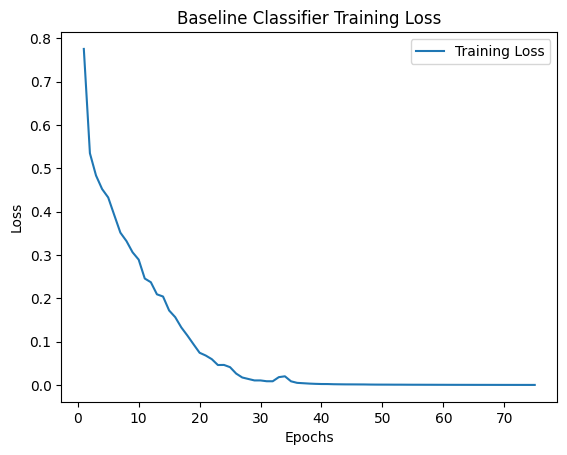

In [5]:
num_epochs_baseline = 75
train_losses = []

print("\n--- Starting Baseline Classifier Training ---")
for epoch in range(num_epochs_baseline):
    baseline_classifier.train()
    running_loss = 0.0
    progress_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs_baseline}", leave=False)

    for i, data in enumerate(progress_bar):
        inputs, labels = data

        inputs, labels = inputs.to(device), labels.to(device)

        optimizer.zero_grad()

        outputs = baseline_classifier(inputs)

        loss = criterion(outputs, labels)

        loss.backward()

        optimizer.step()

        running_loss += loss.item()
        if i % 10 == 9: 
             progress_bar.set_postfix({'loss': f'{running_loss / (i+1):.3f}'})


    epoch_loss = running_loss / len(train_loader)
    train_losses.append(epoch_loss)
    print(f"Epoch [{epoch+1}/{num_epochs_baseline}], Loss: {epoch_loss:.4f}")

print("--- Finished Baseline Classifier Training ---")

plt.figure()
plt.plot(range(1, num_epochs_baseline + 1), train_losses, label='Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Baseline Classifier Training Loss')
plt.legend()
plt.show()

In [6]:
def evaluate_model(model, data_loader, device, num_classes, class_names):
    model.eval() 
    all_preds = []
    all_labels = []

    with torch.no_grad(): 
        for data in tqdm(data_loader, desc="Evaluating"):
            inputs, labels = data

            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1) 

            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    accuracy = accuracy_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds, average='weighted') 
    cm = confusion_matrix(all_labels, all_preds)
    report = classification_report(all_labels, all_preds, target_names=[class_names[i] for i in selected_classes])


    print(f"\nTest Accuracy: {accuracy * 100:.2f}%")
    print(f"Test F1 Score (Weighted): {f1:.4f}")
    print("\nConfusion Matrix:")
    print(cm)
    print("\nClassification Report:")
    print(report)

    return accuracy, f1 
    
print("\n--- Evaluating Baseline Classifier on Test Set ---")
baseline_accuracy, baseline_f1 = evaluate_model(baseline_classifier, test_loader, device, num_classes, full_train_dataset.classes)

baseline_results = {"accuracy": baseline_accuracy, "f1_score": baseline_f1}
print(f"\nBaseline results saved: {baseline_results}")


--- Evaluating Baseline Classifier on Test Set ---


Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]


Test Accuracy: 85.90%
Test F1 Score (Weighted): 0.8586

Confusion Matrix:
[[814  71 115]
 [ 44 918  38]
 [112  43 845]]

Classification Report:
              precision    recall  f1-score   support

    airplane       0.84      0.81      0.83      1000
  automobile       0.89      0.92      0.90      1000
        bird       0.85      0.84      0.85      1000

    accuracy                           0.86      3000
   macro avg       0.86      0.86      0.86      3000
weighted avg       0.86      0.86      0.86      3000


Baseline results saved: {'accuracy': 0.859, 'f1_score': 0.8585950306729182}


In [7]:
nz = 100 
ngf = 64 
ndf = 64 
nc = 3   

def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('Linear') != -1: 
         nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

class Generator(nn.Module):
    def __init__(self, nz, ngf, nc):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            nn.ConvTranspose2d(nz, ngf * 4, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )
    def forward(self, input):
        return self.main(input)

class Critic(nn.Module):
    def __init__(self, nc, ndf):
        super(Critic, self).__init__()
        self.main = nn.Sequential(
            # input: (nc) x 32 x 32
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False), # Output: (ndf) x 16 x 16
            nn.LeakyReLU(0.2, inplace=True),
            # State: (ndf) x 16 x 16
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False), # Output: (ndf*2) x 8 x 8
            nn.InstanceNorm2d(ndf * 2, affine=True), 
            nn.LeakyReLU(0.2, inplace=True),
            # State: (ndf*2) x 8 x 8
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False), # Output: (ndf*4) x 4 x 4
            nn.InstanceNorm2d(ndf * 4, affine=True),
            nn.LeakyReLU(0.2, inplace=True),
            # State: (ndf*4) x 4 x 4
            nn.Conv2d(ndf * 4, 1, 4, 1, 0, bias=False) # Output: 1 x 1 x 1 
        )
    def forward(self, input):
        return self.main(input) # Output (batch_size, 1, 1, 1) 

In [8]:
def compute_gradient_penalty(critic, real_samples, fake_samples, device):
    """Calculates the gradient penalty loss for WGAN GP"""
    alpha = torch.rand(real_samples.size(0), 1, 1, 1, device=device)
    interpolates = (alpha * real_samples + ((1 - alpha) * fake_samples)).requires_grad_(True)
    d_interpolates = critic(interpolates) # Shape: [batch_size, 1, 1, 1]
    fake_outputs = torch.ones(d_interpolates.size(), device=device, requires_grad=False)

    gradients = autograd.grad(
        outputs=d_interpolates,
        inputs=interpolates,
        grad_outputs=fake_outputs, 
        create_graph=True, 
        retain_graph=True,
        only_inputs=True,
    )[0]
    gradients = gradients.view(gradients.size(0), -1) 
    
    gradient_penalty = ((gradients.norm(2, dim=1) - 1) ** 2).mean()
    return gradient_penalty

In [9]:
lambda_gp = 10  
n_critic = 5   
netG_wgan = Generator(nz, ngf, nc).to(device)
netC_wgan = Critic(nc, ndf).to(device) 

netG_wgan.apply(weights_init)
netC_wgan.apply(weights_init)

print("\n--- WGAN-GP Generator Architecture ---")
print(netG_wgan)
print("\n--- WGAN-GP Critic Architecture ---")
print(netC_wgan)


--- WGAN-GP Generator Architecture ---
Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 256, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): Tanh()
  )
)

--- WGAN-GP Critic Architecture ---
Critic(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negativ

In [10]:
lr_wgan = 0.0001 
beta1_wgan = 0.0 
beta2_wgan = 0.9
optimizerC = optim.Adam(netC_wgan.parameters(), lr=lr_wgan, betas=(beta1_wgan, beta2_wgan))
optimizerG = optim.Adam(netG_wgan.parameters(), lr=lr_wgan, betas=(beta1_wgan, beta2_wgan))

fixed_noise = torch.randn(64, nz, 1, 1, device=device)

In [11]:
num_epochs_wgan = 75 
G_losses_wgan = []
C_losses_wgan = []
img_list_wgan = []
iters_wgan = 0

print("\n--- Starting WGAN-GP Training ---")

for epoch in range(num_epochs_wgan):
    progress_bar_wgan = tqdm(train_loader, desc=f"WGAN-GP Epoch {epoch+1}/{num_epochs_wgan}", leave=False)
    for i, data in enumerate(progress_bar_wgan, 0):

        for _ in range(n_critic):
            netC_wgan.zero_grad()
            real_cpu = data[0].to(device)
            b_size = real_cpu.size(0)

            noise = torch.randn(b_size, nz, 1, 1, device=device)
            fake = netG_wgan(noise)

            critic_real = netC_wgan(real_cpu)
            critic_fake = netC_wgan(fake.detach()) 
            gradient_penalty = compute_gradient_penalty(netC_wgan, real_cpu.data, fake.data, device)

            loss_critic = torch.mean(critic_fake) - torch.mean(critic_real) + lambda_gp * gradient_penalty
            loss_critic.backward()
            optimizerC.step()

        C_losses_wgan.append(loss_critic.item())

        netG_wgan.zero_grad()

        noise = torch.randn(b_size, nz, 1, 1, device=device) 
        fake_for_G = netG_wgan(noise)

        critic_fake_for_G = netC_wgan(fake_for_G)
        loss_gen = -torch.mean(critic_fake_for_G)
        loss_gen.backward()
        optimizerG.step()

        G_losses_wgan.append(loss_gen.item())

        if i % 50 == 0:
             progress_bar_wgan.set_postfix({
                 'Loss_C': f'{loss_critic.item():.4f}',
                 'Loss_G': f'{loss_gen.item():.4f}',
                 'D(real)': f'{torch.mean(critic_real).item():.4f}',
                 'D(fake)': f'{torch.mean(critic_fake).item():.4f}'
             })

        if (iters_wgan % 500 == 0) or ((epoch == num_epochs_wgan-1) and (i == len(train_loader)-1)):
             with torch.no_grad():
                 fake_display_wgan = netG_wgan(fixed_noise).detach().cpu()
             img_list_wgan.append(torchvision.utils.make_grid(fake_display_wgan, padding=2, normalize=True))

        iters_wgan += 1

    print(f"Epoch [{epoch+1}/{num_epochs_wgan}] Loss_C: {loss_critic.item():.4f} Loss_G: {loss_gen.item():.4f}")


--- Starting WGAN-GP Training ---


WGAN-GP Epoch 1/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [1/75] Loss_C: -5.3484 Loss_G: 3.5201


WGAN-GP Epoch 2/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [2/75] Loss_C: -4.2442 Loss_G: 1.7309


WGAN-GP Epoch 3/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [3/75] Loss_C: -4.8961 Loss_G: 2.8627


WGAN-GP Epoch 4/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [4/75] Loss_C: -5.1697 Loss_G: 4.0051


WGAN-GP Epoch 5/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [5/75] Loss_C: -5.0073 Loss_G: 4.7710


WGAN-GP Epoch 6/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [6/75] Loss_C: -4.9513 Loss_G: 6.1097


WGAN-GP Epoch 7/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [7/75] Loss_C: -4.5745 Loss_G: 6.6261


WGAN-GP Epoch 8/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [8/75] Loss_C: -4.4556 Loss_G: 7.2252


WGAN-GP Epoch 9/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [9/75] Loss_C: -5.0297 Loss_G: 7.8326


WGAN-GP Epoch 10/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [10/75] Loss_C: -5.3288 Loss_G: 8.1628


WGAN-GP Epoch 11/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [11/75] Loss_C: -5.3023 Loss_G: 9.0983


WGAN-GP Epoch 12/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [12/75] Loss_C: -6.1213 Loss_G: 9.9267


WGAN-GP Epoch 13/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [13/75] Loss_C: -5.6988 Loss_G: 9.1910


WGAN-GP Epoch 14/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [14/75] Loss_C: -5.0349 Loss_G: 9.4212


WGAN-GP Epoch 15/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [15/75] Loss_C: -5.8336 Loss_G: 8.6854


WGAN-GP Epoch 16/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [16/75] Loss_C: -6.0441 Loss_G: 8.7642


WGAN-GP Epoch 17/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [17/75] Loss_C: -5.3362 Loss_G: 9.7885


WGAN-GP Epoch 18/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [18/75] Loss_C: -6.6169 Loss_G: 9.3428


WGAN-GP Epoch 19/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [19/75] Loss_C: -5.1803 Loss_G: 9.2346


WGAN-GP Epoch 20/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [20/75] Loss_C: -5.5146 Loss_G: 9.5606


WGAN-GP Epoch 21/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [21/75] Loss_C: -5.1728 Loss_G: 9.3530


WGAN-GP Epoch 22/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [22/75] Loss_C: -4.7842 Loss_G: 9.1591


WGAN-GP Epoch 23/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [23/75] Loss_C: -5.3710 Loss_G: 9.1998


WGAN-GP Epoch 24/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [24/75] Loss_C: -6.0681 Loss_G: 9.7747


WGAN-GP Epoch 25/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [25/75] Loss_C: -5.8427 Loss_G: 8.8436


WGAN-GP Epoch 26/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [26/75] Loss_C: -5.3883 Loss_G: 10.5187


WGAN-GP Epoch 27/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [27/75] Loss_C: -5.5291 Loss_G: 10.1955


WGAN-GP Epoch 28/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [28/75] Loss_C: -4.9255 Loss_G: 10.7641


WGAN-GP Epoch 29/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [29/75] Loss_C: -5.6362 Loss_G: 10.2748


WGAN-GP Epoch 30/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [30/75] Loss_C: -5.3388 Loss_G: 10.8656


WGAN-GP Epoch 31/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [31/75] Loss_C: -5.9996 Loss_G: 11.4964


WGAN-GP Epoch 32/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [32/75] Loss_C: -5.8622 Loss_G: 12.5108


WGAN-GP Epoch 33/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [33/75] Loss_C: -5.0062 Loss_G: 13.4206


WGAN-GP Epoch 34/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [34/75] Loss_C: -5.3837 Loss_G: 13.4158


WGAN-GP Epoch 35/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [35/75] Loss_C: -5.6018 Loss_G: 13.1291


WGAN-GP Epoch 36/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [36/75] Loss_C: -5.3190 Loss_G: 13.8853


WGAN-GP Epoch 37/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [37/75] Loss_C: -5.6890 Loss_G: 14.7751


WGAN-GP Epoch 38/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [38/75] Loss_C: -5.4469 Loss_G: 15.1702


WGAN-GP Epoch 39/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [39/75] Loss_C: -5.9197 Loss_G: 15.1946


WGAN-GP Epoch 40/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [40/75] Loss_C: -5.2349 Loss_G: 15.1565


WGAN-GP Epoch 41/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [41/75] Loss_C: -5.8266 Loss_G: 15.9360


WGAN-GP Epoch 42/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [42/75] Loss_C: -6.0798 Loss_G: 16.5594


WGAN-GP Epoch 43/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [43/75] Loss_C: -6.0207 Loss_G: 16.2143


WGAN-GP Epoch 44/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [44/75] Loss_C: -6.5127 Loss_G: 17.1944


WGAN-GP Epoch 45/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [45/75] Loss_C: -5.2067 Loss_G: 16.4907


WGAN-GP Epoch 46/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [46/75] Loss_C: -5.4850 Loss_G: 17.0337


WGAN-GP Epoch 47/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [47/75] Loss_C: -6.0728 Loss_G: 18.1413


WGAN-GP Epoch 48/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [48/75] Loss_C: -6.3465 Loss_G: 19.0323


WGAN-GP Epoch 49/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [49/75] Loss_C: -6.9211 Loss_G: 18.5456


WGAN-GP Epoch 50/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [50/75] Loss_C: -6.5999 Loss_G: 20.0436


WGAN-GP Epoch 51/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [51/75] Loss_C: -5.7784 Loss_G: 19.2937


WGAN-GP Epoch 52/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [52/75] Loss_C: -5.7716 Loss_G: 20.4985


WGAN-GP Epoch 53/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [53/75] Loss_C: -7.4654 Loss_G: 20.4754


WGAN-GP Epoch 54/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [54/75] Loss_C: -5.9299 Loss_G: 20.1721


WGAN-GP Epoch 55/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [55/75] Loss_C: -6.6962 Loss_G: 22.4970


WGAN-GP Epoch 56/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [56/75] Loss_C: -6.3454 Loss_G: 22.9541


WGAN-GP Epoch 57/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [57/75] Loss_C: -6.9428 Loss_G: 23.3086


WGAN-GP Epoch 58/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [58/75] Loss_C: -6.2388 Loss_G: 23.8699


WGAN-GP Epoch 59/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [59/75] Loss_C: -5.8451 Loss_G: 22.4146


WGAN-GP Epoch 60/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [60/75] Loss_C: -6.3433 Loss_G: 23.1575


WGAN-GP Epoch 61/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [61/75] Loss_C: -6.4979 Loss_G: 25.1142


WGAN-GP Epoch 62/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [62/75] Loss_C: -7.3197 Loss_G: 24.3780


WGAN-GP Epoch 63/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [63/75] Loss_C: -6.6543 Loss_G: 25.5080


WGAN-GP Epoch 64/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [64/75] Loss_C: -6.3398 Loss_G: 24.9390


WGAN-GP Epoch 65/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [65/75] Loss_C: -7.9051 Loss_G: 24.2940


WGAN-GP Epoch 66/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [66/75] Loss_C: -6.2472 Loss_G: 27.5284


WGAN-GP Epoch 67/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [67/75] Loss_C: -7.2116 Loss_G: 26.1693


WGAN-GP Epoch 68/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [68/75] Loss_C: -7.3317 Loss_G: 27.4297


WGAN-GP Epoch 69/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [69/75] Loss_C: -7.0581 Loss_G: 27.6433


WGAN-GP Epoch 70/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [70/75] Loss_C: -5.8884 Loss_G: 28.8344


WGAN-GP Epoch 71/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [71/75] Loss_C: -7.0240 Loss_G: 27.3437


WGAN-GP Epoch 72/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [72/75] Loss_C: -6.9859 Loss_G: 28.6570


WGAN-GP Epoch 73/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [73/75] Loss_C: -7.2313 Loss_G: 27.7948


WGAN-GP Epoch 74/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [74/75] Loss_C: -7.9126 Loss_G: 26.7440


WGAN-GP Epoch 75/75:   0%|          | 0/47 [00:00<?, ?it/s]

Epoch [75/75] Loss_C: -6.8901 Loss_G: 27.8738


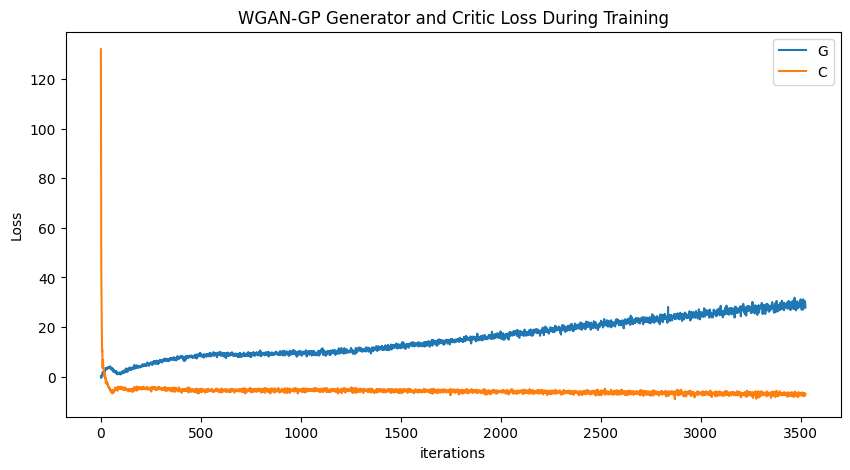

In [12]:
plt.figure(figsize=(10,5))
plt.title("WGAN-GP Generator and Critic Loss During Training")
plt.plot(G_losses_wgan,label="G")
plt.plot(C_losses_wgan,label="C")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

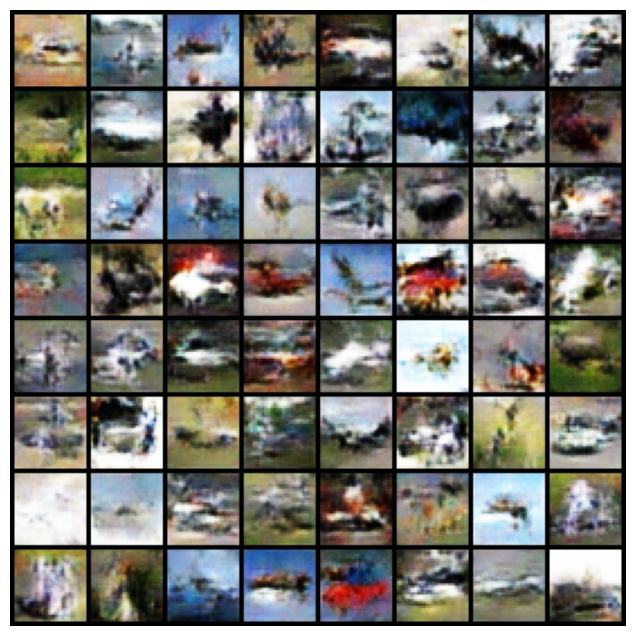

In [13]:
import matplotlib.animation as animation
from IPython.display import HTML

if img_list_wgan:
    fig = plt.figure(figsize=(8,8))
    plt.axis("off")
    ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list_wgan]
    ani = animation.ArtistAnimation(fig, ims, interval=100, repeat_delay=1000, blit=True)
    display(HTML(ani.to_jshtml())) 
else:
    print("No images were generated for animation (check iteration count and conditions).")


In [14]:
torch.save(netG_wgan.state_dict(), 'generator_epoch_{}.pth'.format(num_epochs_wgan))

In [15]:
!pip install -q onnx onnxruntime

try:
    import onnx
    import onnxruntime
    onnx_available = True
    print(f"ONNX version: {onnx.__version__}")
    print(f"ONNX Runtime version: {onnxruntime.__version__}")
except ImportError:
    print("ONNX or ONNX Runtime not found. Skipping ONNX export.")
    print("Install them using: pip install onnx onnxruntime")
    onnx_available = False

if onnx_available:
    netG_wgan.eval()

    dummy_input = torch.randn(1, nz, 1, 1, device=device)

    onnx_file_path = "generator_dcgan_cifar_subset.onnx"
    print(f"\nAttempting to export Generator model to {onnx_file_path}...")

    try:
        torch.onnx.export(
            netG_wgan,                      
            dummy_input,               
            onnx_file_path,            
            export_params=True,        
            opset_version=11,          
            do_constant_folding=True,  
            input_names = ['latent_vector'], 
            output_names = ['output_image'], 
            dynamic_axes={'latent_vector' : {0 : 'batch_size'}, 
                          'output_image' : {0 : 'batch_size'}}
        )
        print(f"Model successfully exported to {onnx_file_path}")

        onnx_model = onnx.load(onnx_file_path)
        onnx.checker.check_model(onnx_model)
        print("ONNX model check passed.")

    except Exception as e:
        print(f"ONNX export failed: {e}")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 97.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 5.5 MB/s eta 0:00:00
ONNX version: 1.17.0
ONNX Runtime version: 1.21.1

Attempting to export Generator model to generator_dcgan_cifar_subset.onnx...
Model successfully exported to generator_dcgan_cifar_subset.onnx
ONNX model check passed.


In [16]:
from torch.utils.data import TensorDataset 

num_synthetic_samples = 1500 
batch_size_generation = 128  
generated_images = []

print(f"\n--- Generating {num_synthetic_samples} synthetic images using the trained Generator ---")
netG_wgan.eval() 

with torch.no_grad():
    for i in tqdm(range(0, num_synthetic_samples, batch_size_generation), desc="Generating Images"):
        current_batch_size = min(batch_size_generation, num_synthetic_samples - i)
        if current_batch_size <= 0:
            break

        noise = torch.randn(current_batch_size, nz, 1, 1, device=device)
        fake_images_batch = netG_wgan(noise)
        
        generated_images.append(fake_images_batch.cpu()) 
        
generated_images_tensor = torch.cat(generated_images, dim=0)

print(f"Successfully generated {generated_images_tensor.size(0)} synthetic images (labels to be assigned via pseudo-labeling).")


--- Generating 1500 synthetic images using the trained Generator ---


Generating Images:   0%|          | 0/12 [00:00<?, ?it/s]

Successfully generated 1500 synthetic images (labels to be assigned via pseudo-labeling).



Skipping Critic-based quality filtering for now.

--- Applying Pseudo-Labeling using Baseline Classifier ---
Applying pseudo-labeling with confidence threshold > 0.95...


Pseudo-Labeling:   0%|          | 0/12 [00:00<?, ?it/s]

Kept 1255 images after pseudo-labeling with threshold > 0.95

Original limited training dataset size: 3000
PSEUDO-LABELED synthetic dataset size: 1255
Augmented training dataset size (with pseudo-labeled synthetic): 4255

Sample PSEUDO-LABELED synthetic images (labels are predictions):


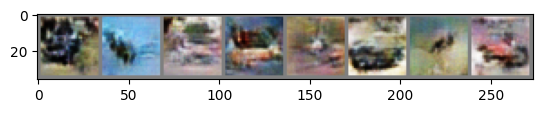

Pseudo Labels:  automobile airplane automobile airplane bird  automobile bird  automobile


In [17]:
print("\nSkipping Critic-based quality filtering for now.")
filtered_images_tensor = generated_images_tensor
print(f"\n--- Applying Pseudo-Labeling using Baseline Classifier ---")

baseline_classifier.eval()

confidence_threshold = 0.95 
pseudo_labeled_images = []
pseudo_labels = []

pseudo_label_batch_size = 128 
temp_pseudo_label_dataset = TensorDataset(filtered_images_tensor) 
temp_pseudo_label_loader = DataLoader(temp_pseudo_label_dataset, batch_size=pseudo_label_batch_size, shuffle=False)

print(f"Applying pseudo-labeling with confidence threshold > {confidence_threshold}...")
with torch.no_grad():
    for batch_data in tqdm(temp_pseudo_label_loader, desc="Pseudo-Labeling"):
        images_batch = batch_data[0].to(device) 

        outputs = baseline_classifier(images_batch)
        probabilities = F.softmax(outputs, dim=1) 

        confidence_scores, predicted_labels = torch.max(probabilities, 1)

        high_confidence_indices = torch.where(confidence_scores > confidence_threshold)[0]

        if len(high_confidence_indices) > 0:
            pseudo_labeled_images.append(images_batch[high_confidence_indices].cpu())
            pseudo_labels.append(predicted_labels[high_confidence_indices].cpu())

if pseudo_labeled_images:
  final_pseudo_images_tensor = torch.cat(pseudo_labeled_images, dim=0)
  final_pseudo_labels_tensor = torch.cat(pseudo_labels, dim=0)
  print(f"Kept {len(final_pseudo_images_tensor)} images after pseudo-labeling with threshold > {confidence_threshold}")
else:
  print(f"No images met the confidence threshold > {confidence_threshold}. Resulting synthetic dataset will be empty.")
  final_pseudo_images_tensor = torch.empty((0, nc, 32, 32), dtype=torch.float32)
  final_pseudo_labels_tensor = torch.empty((0,), dtype=torch.long)

synthetic_dataset = TensorDataset(final_pseudo_images_tensor, final_pseudo_labels_tensor)

original_limited_images = []
original_limited_labels = []
temp_loader = DataLoader(limited_train_dataset, batch_size=len(limited_train_dataset))
original_images_batch, original_labels_batch = next(iter(temp_loader))
original_limited_images.append(original_images_batch)
original_limited_labels.append(original_labels_batch)
original_limited_images_tensor = torch.cat(original_limited_images, dim=0)
original_limited_labels_tensor = torch.cat(original_limited_labels, dim=0)
original_limited_tensor_dataset = TensorDataset(original_limited_images_tensor, original_limited_labels_tensor)

augmented_dataset = ConcatDataset([original_limited_tensor_dataset, synthetic_dataset])

print(f"\nOriginal limited training dataset size: {len(original_limited_tensor_dataset)}")
print(f"PSEUDO-LABELED synthetic dataset size: {len(synthetic_dataset)}")
print(f"Augmented training dataset size (with pseudo-labeled synthetic): {len(augmented_dataset)}")

augmented_train_loader = DataLoader(augmented_dataset, batch_size=batch_size, shuffle=True, num_workers=2)

if len(synthetic_dataset) > 0:
    print("\nSample PSEUDO-LABELED synthetic images (labels are predictions):")
    try:
        pseudo_dataiter = iter(DataLoader(synthetic_dataset, batch_size=min(8, len(synthetic_dataset)), shuffle=True))
        pseudo_images, pseudo_assigned_labels = next(pseudo_dataiter)
        imshow(torchvision.utils.make_grid(pseudo_images))
        print('Pseudo Labels: ', ' '.join(f'{full_train_dataset.classes[pseudo_assigned_labels[j].item()]:5s}' for j in range(len(pseudo_assigned_labels))))
    except StopIteration:
        print("Could not retrieve a batch from the pseudo-labeled dataset for display.")
else:
    print("\nNo synthetic samples met the confidence threshold to display.")

In [18]:
augmented_classifier = SimpleCNN(num_classes=num_classes).to(device)

print("\n--- Augmented Classifier Architecture (Same as Baseline) ---")
print(augmented_classifier)

optimizer_augmented = optim.Adam(augmented_classifier.parameters(), lr=0.001)


--- Augmented Classifier Architecture (Same as Baseline) ---
SimpleCNN(
  (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=2048, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=3, bias=True)
)


In [19]:
augmented_train_losses = []

print("\n--- Starting Augmented Classifier Training (Using Augmented Data) ---")
for epoch in range(num_epochs_baseline): 
    augmented_classifier.train() 
    running_loss_aug = 0.0
    progress_bar_aug = tqdm(augmented_train_loader, desc=f"Epoch {epoch+1}/{num_epochs_baseline} (Augmented)", leave=False)

    for i, data in enumerate(progress_bar_aug):
        inputs, labels = data
        
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer_augmented.zero_grad()

        outputs = augmented_classifier(inputs)

        loss = criterion(outputs, labels)

        loss.backward()

        optimizer_augmented.step()

        running_loss_aug += loss.item()
        if i % 50 == 49:
             progress_bar_aug.set_postfix({'loss': f'{running_loss_aug / (i+1):.3f}'})

    epoch_loss_aug = running_loss_aug / len(augmented_train_loader)
    augmented_train_losses.append(epoch_loss_aug)
    print(f"Epoch [{epoch+1}/{num_epochs_baseline}] (Augmented), Loss: {epoch_loss_aug:.4f}")


--- Starting Augmented Classifier Training (Using Augmented Data) ---


Epoch 1/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [1/75] (Augmented), Loss: 0.6989


Epoch 2/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [2/75] (Augmented), Loss: 0.4940


Epoch 3/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [3/75] (Augmented), Loss: 0.4325


Epoch 4/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [4/75] (Augmented), Loss: 0.3951


Epoch 5/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [5/75] (Augmented), Loss: 0.3682


Epoch 6/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [6/75] (Augmented), Loss: 0.3231


Epoch 7/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [7/75] (Augmented), Loss: 0.2986


Epoch 8/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [8/75] (Augmented), Loss: 0.2785


Epoch 9/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [9/75] (Augmented), Loss: 0.2368


Epoch 10/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [10/75] (Augmented), Loss: 0.2226


Epoch 11/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [11/75] (Augmented), Loss: 0.2097


Epoch 12/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [12/75] (Augmented), Loss: 0.1805


Epoch 13/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [13/75] (Augmented), Loss: 0.1692


Epoch 14/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [14/75] (Augmented), Loss: 0.1390


Epoch 15/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [15/75] (Augmented), Loss: 0.1206


Epoch 16/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [16/75] (Augmented), Loss: 0.1039


Epoch 17/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [17/75] (Augmented), Loss: 0.0931


Epoch 18/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [18/75] (Augmented), Loss: 0.0792


Epoch 19/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [19/75] (Augmented), Loss: 0.0736


Epoch 20/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [20/75] (Augmented), Loss: 0.0597


Epoch 21/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [21/75] (Augmented), Loss: 0.0406


Epoch 22/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [22/75] (Augmented), Loss: 0.0364


Epoch 23/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [23/75] (Augmented), Loss: 0.0363


Epoch 24/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [24/75] (Augmented), Loss: 0.0222


Epoch 25/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [25/75] (Augmented), Loss: 0.0403


Epoch 26/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [26/75] (Augmented), Loss: 0.0411


Epoch 27/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [27/75] (Augmented), Loss: 0.0157


Epoch 28/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [28/75] (Augmented), Loss: 0.0078


Epoch 29/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [29/75] (Augmented), Loss: 0.0061


Epoch 30/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [30/75] (Augmented), Loss: 0.0061


Epoch 31/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [31/75] (Augmented), Loss: 0.0048


Epoch 32/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [32/75] (Augmented), Loss: 0.0042


Epoch 33/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [33/75] (Augmented), Loss: 0.0031


Epoch 34/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [34/75] (Augmented), Loss: 0.0031


Epoch 35/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [35/75] (Augmented), Loss: 0.0028


Epoch 36/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [36/75] (Augmented), Loss: 0.0020


Epoch 37/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [37/75] (Augmented), Loss: 0.0019


Epoch 38/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [38/75] (Augmented), Loss: 0.0017


Epoch 39/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [39/75] (Augmented), Loss: 0.0014


Epoch 40/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [40/75] (Augmented), Loss: 0.0015


Epoch 41/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [41/75] (Augmented), Loss: 0.0011


Epoch 42/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [42/75] (Augmented), Loss: 0.0011


Epoch 43/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [43/75] (Augmented), Loss: 0.0010


Epoch 44/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [44/75] (Augmented), Loss: 0.0009


Epoch 45/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [45/75] (Augmented), Loss: 0.0008


Epoch 46/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [46/75] (Augmented), Loss: 0.0008


Epoch 47/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [47/75] (Augmented), Loss: 0.0007


Epoch 48/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [48/75] (Augmented), Loss: 0.0007


Epoch 49/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [49/75] (Augmented), Loss: 0.0006


Epoch 50/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [50/75] (Augmented), Loss: 0.0006


Epoch 51/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [51/75] (Augmented), Loss: 0.0006


Epoch 52/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [52/75] (Augmented), Loss: 0.0005


Epoch 53/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [53/75] (Augmented), Loss: 0.0005


Epoch 54/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [54/75] (Augmented), Loss: 0.0005


Epoch 55/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [55/75] (Augmented), Loss: 0.0004


Epoch 56/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [56/75] (Augmented), Loss: 0.0004


Epoch 57/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [57/75] (Augmented), Loss: 0.0004


Epoch 58/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [58/75] (Augmented), Loss: 0.0004


Epoch 59/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [59/75] (Augmented), Loss: 0.0003


Epoch 60/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [60/75] (Augmented), Loss: 0.0003


Epoch 61/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [61/75] (Augmented), Loss: 0.0003


Epoch 62/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [62/75] (Augmented), Loss: 0.0003


Epoch 63/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [63/75] (Augmented), Loss: 0.0003


Epoch 64/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [64/75] (Augmented), Loss: 0.0002


Epoch 65/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [65/75] (Augmented), Loss: 0.0002


Epoch 66/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [66/75] (Augmented), Loss: 0.0002


Epoch 67/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [67/75] (Augmented), Loss: 0.0002


Epoch 68/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [68/75] (Augmented), Loss: 0.0002


Epoch 69/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [69/75] (Augmented), Loss: 0.0002


Epoch 70/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [70/75] (Augmented), Loss: 0.0002


Epoch 71/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [71/75] (Augmented), Loss: 0.0002


Epoch 72/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [72/75] (Augmented), Loss: 0.0002


Epoch 73/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [73/75] (Augmented), Loss: 0.0001


Epoch 74/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [74/75] (Augmented), Loss: 0.0001


Epoch 75/75 (Augmented):   0%|          | 0/67 [00:00<?, ?it/s]

Epoch [75/75] (Augmented), Loss: 0.0001


--- Finished Augmented Classifier Training ---


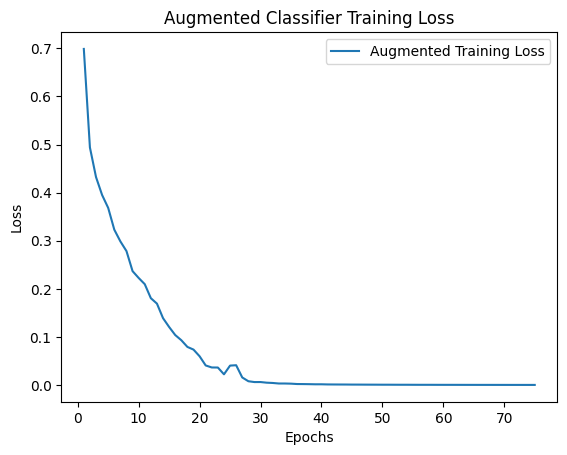

In [20]:
print("--- Finished Augmented Classifier Training ---")

plt.figure()
plt.plot(range(1, num_epochs_baseline + 1), augmented_train_losses, label='Augmented Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Augmented Classifier Training Loss')
plt.legend()
plt.show()


In [21]:
print("\n--- Evaluating Augmented Classifier on Test Set ---")
augmented_accuracy, augmented_f1 = evaluate_model(augmented_classifier, test_loader, device, num_classes, full_train_dataset.classes)

augmented_results = {"accuracy": augmented_accuracy, "f1_score": augmented_f1}
print(f"\nAugmented results saved: {augmented_results}")

print(f"Baseline results were: {baseline_results}")


--- Evaluating Augmented Classifier on Test Set ---


Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]


Test Accuracy: 84.77%
Test F1 Score (Weighted): 0.8474

Confusion Matrix:
[[802  79 119]
 [ 60 902  38]
 [118  43 839]]

Classification Report:
              precision    recall  f1-score   support

    airplane       0.82      0.80      0.81      1000
  automobile       0.88      0.90      0.89      1000
        bird       0.84      0.84      0.84      1000

    accuracy                           0.85      3000
   macro avg       0.85      0.85      0.85      3000
weighted avg       0.85      0.85      0.85      3000


Augmented results saved: {'accuracy': 0.8476666666666667, 'f1_score': 0.847362240217516}
Baseline results were: {'accuracy': 0.859, 'f1_score': 0.8585950306729182}


In [22]:
print("\n--- Comparison: Baseline vs. GAN Augmented ---")
print("-" * 50)
print(f"Metric        | Baseline        | Augmented (GAN) | Improvement")
print("-" * 50)

acc_baseline = baseline_results['accuracy']
acc_augmented = augmented_results['accuracy']
acc_improvement = acc_augmented - acc_baseline
print(f"Accuracy      | {acc_baseline * 100:^15.2f}% | {acc_augmented * 100:^15.2f}% | {acc_improvement * 100:^+8.2f}%")

f1_baseline = baseline_results['f1_score']
f1_augmented = augmented_results['f1_score']
f1_improvement = f1_augmented - f1_baseline
print(f"F1 Score (W)  | {f1_baseline:^15.4f} | {f1_augmented:^15.4f} | {f1_improvement:^+8.4f}")
print("-" * 50)

if acc_improvement > 0:
    print("\nConclusion: GAN-based data augmentation resulted in an improvement in classifier performance!")
elif acc_improvement == 0:
    print("\nConclusion: GAN-based data augmentation did not change the classifier performance.")
else:
    print("\nConclusion: GAN-based data augmentation resulted in a decrease in classifier performance.")


--- Comparison: Baseline vs. GAN Augmented ---
--------------------------------------------------
Metric        | Baseline        | Augmented (GAN) | Improvement
--------------------------------------------------
Accuracy      |      85.90     % |      84.77     % |  -1.13  %
F1 Score (W)  |     0.8586      |     0.8474      | -0.0112 
--------------------------------------------------

Conclusion: GAN-based data augmentation resulted in a decrease in classifier performance.
